##### Installing Specific Libraries

**App store scraper**

```
pip install app_store_scraper 
```
**google play store scraper**

```
pip install google-play-scraper


##### Importing Libraries

In [476]:
#Importing Libraries
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline
import json 
from pandas.plotting import parallel_coordinates

import os
import sqlite3
import math
from collections import Counter
from pathlib import Path
from tqdm import tqdm
import scipy.stats as stats

#App store and Google play scraping
from google_play_scraper import app, Sort, reviews, reviews_all
from app_store_scraper import AppStore


# Visualization
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly
import plotly.graph_objects as go
import plotly.express as px 
from plotly.subplots import make_subplots
import plotly.io as pio

#Machine Learning + Others 
import nltk
from nltk.stem import PorterStemmer
import warnings 
warnings.filterwarnings("ignore", category=DeprecationWarning)
nltk.download('stopwords')
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Cornel\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


##### Project brief

**Loan Apps**
1. Fairmoney, 
2. Branch 
3. Palmcredit 
4. Carbon
5. Quickcredit
6. Newcredit


> Fair Money
    >> App Store: Unavailable on Appstore                           
    >> app name:                          
       app_id:                          
       country: ng                         
    
   >> Google Store: (https://play.google.com/store/apps/details?id=ng.com.fairmoney.fairmoney&hl=en)                         
    >> app_id: ng.com.fairmoney.fairmoney                          
        country: ng                         
            
> Branch                         
    >> App Store: Unavailable on Appstore                         
     >>  app name:                          
       app_id:                          
       country: ng                         
    
>> Google Store: (https://play.google.com/store/apps/details?id=com.branch_international.branch.branch_demo_android )            >> app_id: com.branch_international.branch.branch_demo_android                          
        country: ng                         
                         
> Palmcredit                         
    >> App Store: Unavailable on Appstore                         
       app name:                          
       app_id:                          
       country: ng                         
    
   >> Google Store: https://play.google.com/store/apps/details?id=com.transsnetfinancial.palmcredit&hl=en&gl=NG             
        app_id: com.transsnetfinancial.palmcredit                         
        country: ng                         
                         
> Carbon                         
    >> App Store: https://apps.apple.com/ng/app/carbon-secure-banking-loans/id1494856668                          
       app name: Carbon: Secure banking & loans                         
       app_id: 1494856668                         
       country: ng                         
                             
   >> Google Store: (https://play.google.com/store/apps/details?id=com.lenddo.mobile.paylater)                         
        app_id: com.lenddo.mobile.paylater                          
        country: ng                         
                         
> Quickcredit                         
    >> App Store: https://apps.apple.com/ng/app/quickcredit/id1564215866                         
       app name: QuickCredit                          
       app_id: 1564215866                         
       country: ng                         
                             
   >> Google Store: (https://play.google.com/store/apps/details?id=com.cash.loan.credit.quick.kash.cash9ja.mobile9.mkopo.instant.online.gocash )                         
        app_id:  com.cash.loan.credit.quick.kash.cash9ja.mobile9.mkopo.instant.online.gocash                          
        country: ng                         
                         
> Newcredit                         
    >> App Store: https://apps.apple.com/ng/app/newcredit/id6444618359                         
       app name: Newcredit                           
       app_id: 6444618359                          
       country: ng                         
                             
   >> Google Store: (https://play.google.com/store/apps/details?id=com.pbank.newcredit )                         
        app_id: com.pbank.newcredit                          
        country: ng                         

##### Extracting Reviews from Apple's Appstore

In [ ]:
#Apples - AppStore
carbon_app = AppStore(country='ng', app_name='Carbon: Secure banking & loans', app_id = '1494856668')
quickcredit_app = AppStore(country='ng', app_name='QuickCredit', app_id = '1564215866')
newcredit_app = AppStore(country='ng', app_name='Newcredit', app_id = '6444618359')

# carbon_app.review(how_many=2000)
# quickcredit_app.review(how_many=2000)
# newcredit_app.review(how_many=2000)


In [ ]:
carbon_app.review(how_many=2000)

In [ ]:
quickcredit_app.review(how_many=2000)

In [ ]:
newcredit_app.review(how_many=2000)

In [ ]:
#Apple's - App Store
#converting from a JSON format to a dataframe:

#1. Carbon Loan App
carbon_app1 = pd.DataFrame(np.array(carbon_app.reviews),columns=['review'])  #apple format
carbon_app1 = carbon_app1.join(pd.DataFrame(carbon_app1.pop('review').tolist()))

#2. QuickCredit Loan App
quickcredit_app1 = pd.DataFrame(np.array(quickcredit_app.reviews),columns=['review'])    #apple format
quickcredit_app1 = quickcredit_app1.join(pd.DataFrame(quickcredit_app1.pop('review').tolist()))

#3. NewCredit Loan App
newcredit_app1 = pd.DataFrame(np.array(newcredit_app.reviews),columns=['review'])    #apple format
newcredit_app1 = newcredit_app1.join(pd.DataFrame(newcredit_app1.pop('review').tolist()))

In [ ]:
# carbon_app1.head()
# quickcredit_app1.head()
# newcredit_app1.head()

In [ ]:
#convert data from Apple reviews to csv
carbon_app1.to_csv(r'C:\Users\Cornel\Documents\5. Projects\Project 1 - Loan App Reviews\Sentiment Analysis\data\raw\Carbon-appstore-reviews.csv', 
                   index = False)
quickcredit_app1.to_csv(r'C:\Users\Cornel\Documents\5. Projects\Project 1 - Loan App Reviews\Sentiment Analysis\data\raw\quickcredit-appstore-reviews.csv', 
                        index = False) 
newcredit_app1.to_csv(r'C:\Users\Cornel\Documents\5. Projects\Project 1 - Loan App Reviews\Sentiment Analysis\data\raw\newcredit-appstore-reviews.csv', 
                      index = False)

##### Extractng Reviews from Google's Playstore

In [ ]:
#documentary for google play scraper (https://pypi.org/project/google-play-scraper/)

#check if the app is available 
from google_play_scraper import app
result = app(
    'com.branch_international.branch.branch_demo_android',
    lang='en', # defaults to 'en'
    country='us' # defaults to 'us'
)

result

In [ ]:
#google  play store
fairmoney_google = reviews_all(
    'ng.com.fairmoney.fairmoney', 
    sleep_milliseconds=0, # defaults to 0
    lang='en', # defaults to 'en'
    country='ng', # defaults to 'us'
    sort=Sort.NEWEST, # defaults to Sort.MOST_RELEVANT
)

branch_google = reviews_all(
    'com.branch_international.branch.branch_demo_android', 
    sleep_milliseconds=0, # defaults to 0
    lang='en', # defaults to 'en'
    country='ng', # defaults to 'us'
    sort=Sort.NEWEST, # defaults to Sort.MOST_RELEVANT
)

palmcredit_google = reviews_all(
    'com.transsnetfinancial.palmcredit', 
    sleep_milliseconds=0, # defaults to 0
    lang='en', # defaults to 'en'
    country='ng', # defaults to 'us'
    sort=Sort.NEWEST, # defaults to Sort.MOST_RELEVANT
)

carbon_google = reviews_all(
    'com.lenddo.mobile.paylater',
    sleep_milliseconds=0, # defaults to 0
    lang='en', # defaults to 'en'
    country='ng', # defaults to 'us'
    sort=Sort.NEWEST, # defaults to Sort.MOST_RELEVANT
)

quickcredit_google = reviews_all(
    'com.cash.loan.credit.quick.kash.cash9ja.mobile9.mkopo.instant.online.gocash',
    sleep_milliseconds=0, # defaults to 0
    lang='en', # defaults to 'en'
    country='ng', # defaults to 'us'
    sort=Sort.NEWEST, # defaults to Sort.MOST_RELEVANT
)

newcredit_google = reviews_all(
    'com.pbank.newcredit',
    sleep_milliseconds=0, # defaults to 0
    lang='en', # defaults to 'en'
    country='ng', # defaults to 'us'
    sort=Sort.NEWEST, # defaults to Sort.MOST_RELEVANT
)

In [ ]:
#Google Play Store
#converting from a JSON format to a dataframe

#1. Carbon Loan App
carbon_google1 = pd.DataFrame(np.array(carbon_google),columns=['review'])   #google format
carbon_google1 = carbon_google1.join(pd.DataFrame(carbon_google1.pop('review').tolist()))

#2. Quickcredit Loan App
quickcredit_google1 = pd.DataFrame(np.array(quickcredit_google),columns=['review']) #google format
quickcredit_google1 = quickcredit_google1.join(pd.DataFrame(quickcredit_google1.pop('review').tolist()))

#3. Newcredit Loan App
newcredit_google1 = pd.DataFrame(np.array(newcredit_google),columns=['review']) #google format
newcredit_google1 = newcredit_google1.join(pd.DataFrame(newcredit_google1.pop('review').tolist()))

#4. Fairmoney Loan App
fairmoney_google1 = pd.DataFrame(np.array(fairmoney_google),columns=['review']) #google format
fairmoney_google1 = fairmoney_google1.join(pd.DataFrame(fairmoney_google1.pop('review').tolist()))

#5. Branch Loan App
branch_google1 = pd.DataFrame(np.array(branch_google),columns=['review']) #google format
branch_google1 = branch_google1.join(pd.DataFrame(branch_google1.pop('review').tolist()))

#6. Palmcredit Loan App
palmcredit_google1 = pd.DataFrame(np.array(palmcredit_google),columns=['review']) #google format
palmcredit_google1 = palmcredit_google1.join(pd.DataFrame(palmcredit_google1.pop('review').tolist()))

In [ ]:
#convert data from Google play reviews to csv
carbon_google1.to_csv(r'C:\Users\Cornel\Documents\5. Projects\Project 1 - Loan App Reviews\Sentiment Analysis\data\raw\Carbon-googleplay-reviews.csv', 
                   index = False)
quickcredit_google1.to_csv(r'C:\Users\Cornel\Documents\5. Projects\Project 1 - Loan App Reviews\Sentiment Analysis\data\raw\quickcredit-googleplay-reviews.csv', 
                   index = False)
newcredit_google1.to_csv(r'C:\Users\Cornel\Documents\5. Projects\Project 1 - Loan App Reviews\Sentiment Analysis\data\raw\newcredit-googleplay-reviews.csv', 
                   index = False)
fairmoney_google1.to_csv(r'C:\Users\Cornel\Documents\5. Projects\Project 1 - Loan App Reviews\Sentiment Analysis\data\raw\fairmoney-googleplay-reviews.csv', 
                   index = False)
branch_google1.to_csv(r'C:\Users\Cornel\Documents\5. Projects\Project 1 - Loan App Reviews\Sentiment Analysis\data\raw\branch-googleplay-reviews.csv', 
                   index = False)
palmcredit_google1.to_csv(r'C:\Users\Cornel\Documents\5. Projects\Project 1 - Loan App Reviews\Sentiment Analysis\data\raw\palmcredit-googleplay-reviews.csv', 
                   index = False)

##### Preprocessing reviews in the dataset

###### reload dataset

In [549]:
'''
    carbon = carbon_app1 + carbon_google1
    quickcheck = quickcredit_app1 + quickcredit_google1
    newcredit = newcredit_app1 + newcredit_google1
    fairmoney = fairmoney_google1
    branch = branch_google1
    palmcredit = palmcredit_google1
'''
#reload dataset
#carbon Loan App
carbon_google1 = pd.read_csv(r'data\raw\Carbon-googleplay-reviews.csv', 
                   )
carbon_app1 = pd.read_csv(r'data\raw\Carbon-appstore-reviews.csv', 
                   )
# cabon = cabon_app1.merge(carbon_google1, on = )

#quickcheck Loan App
quickcredit_google1 = pd.read_csv(r'data\raw\quickcredit-googleplay-reviews.csv', 
                   )
quickcredit_app1 = pd.read_csv(r'data\raw\quickcredit-appstore-reviews.csv', 
                    ) 
# quickcheck = cabon_app1.merge(carbon_google1, on = )

#newcredit loan app
newcredit_google1 = pd.read_csv(r'data\raw\newcredit-googleplay-reviews.csv', 
                  )
newcredit_app1 = pd.read_csv(r'data\raw\newcredit-appstore-reviews.csv', 
                    )
# newcredit = cabon_app1.merge(carbon_google1, on = )

#fairmoney Loan App
fairmoney = pd.read_csv(r'data\raw\fairmoney-googleplay-reviews.csv', 
                   )

#branch Loan App
branch = pd.read_csv(r'data\raw\branch-googleplay-reviews.csv', 
                  )

#Palmcredit Loan App
palmcredit = pd.read_csv(r'data\raw\palmcredit-googleplay-reviews.csv', 
                   )



###### remove missing values

In [550]:
#carbon google has missing values in their review column
carbon_google1= carbon_google1.dropna(subset=['content'])

######  brief preprocessing (renaming columns appropriately and droping irrelevant columns)

In [551]:
#brief preprocessing (renaming columns appropriately, inferring date and time,  and droping irrelevant columns)
def preprocess_reviews_google(df):
    """preprocess dataframe for google loan apps by converting strings to lowercase, renaming specific columns, 
    parsing and sorting dates, removing nan values, and then converting to lower case

    Args:
    df (dataframe): a pandas dataframe (representing the google loan apps)

    Returns:
    df(dataframe): a preprocessed dataframe is returned
    """
    df = df.applymap(lambda x: x.lower() if type(x) == str else x)
    df = df.rename(columns={'content': 'title', 'score': 'rating', "at": "date", "replyContent": "developerResponse", "repliedAt": "developerResponseDate"})
    df[["date", "developerResponseDate"]] = df[["date", "developerResponseDate"]].apply(pd.to_datetime, infer_datetime_format=True)
    df = df.sort_values(by = ['date'], ascending = False)
    df = df[df['title'].notna()]
    df['title'] = df['title'].str.lower()
    return df

def preprocess_reviews_apple(df):
    """preprocess dataframes for apple loan apps by converting strings to lowercase, renaming specific columns, 
    parsing and sorting dates, removing nan values, and then converting to lower case

    Args:
    df (dataframe): a pandas dataframe (representing the google loan apps)

    Returns:
    df(dataframe): a preprocessed dataframe is returned
    """
    df = df.drop("isEdited", axis=1)
    df = df.applymap(lambda x: x.lower() if type(x) == str else x)
    df["date"] = pd.to_datetime(df["date"], infer_datetime_format=True)
    df = df.sort_values(by = ['date'], ascending = False)
    df = df[df['review'].notna()]
    df['review'] = df['review'].str.lower()
    return df

carbon_google1 = preprocess_reviews_google(carbon_google1)
carbon_app1 = preprocess_reviews_apple(carbon_app1)

quickcredit_google1 = preprocess_reviews_google(quickcredit_google1)
quickcredit_app1 = preprocess_reviews_apple(quickcredit_app1)

newcredit_google1 = preprocess_reviews_google(newcredit_google1)
newcredit_app1 = preprocess_reviews_apple(newcredit_app1)

fairmoney = preprocess_reviews_google(fairmoney)
branch = preprocess_reviews_google(branch)
palmcredit = preprocess_reviews_google(palmcredit)

In [552]:
carbon_google1.head(2)

,reviewId,userName,userImage,title,rating,thumbsUpCount,reviewCreatedVersion,date,developerResponse,developerResponseDate
0,c28addc6-eef3-4240-9624-473f501853e2,aneke collins,https://play-lh.googleusercontent.com/a-/ad5-w...,super effective and seamless services,5,0,9.0.7,2023-01-24 05:41:18,"hi collins, it is delightful to hear such posi...",2023-01-24 08:16:23
1,985946fb-9939-4125-a074-11db461313c5,joshua odafe legbeti,https://play-lh.googleusercontent.com/a-/ad5-w...,the best banking app you can ever come across....,5,0,9.0.7,2023-01-24 05:14:06,"hi joshua, it is delightful to hear such posit...",2022-12-28 09:16:17


###### Removing Punctuations, Numbers, and Special Characters

In [553]:
def convert_to_str(df, **kwargs):
    """
    Convert multiple columns in a dataframe from object to string type
    
    df : pandas dataframe
        The dataframe whose columns are to be converted
    **kwargs : dict
        Column names as keys and their desired data type as values
        
    Returns
    -------
    pandas dataframe
        The dataframe with the specified columns converted to string type
    """
    for column in kwargs.keys():
        if df[column].dtype == 'object':
            df[column] = df[column].astype(str)
    return df


carbon_google1 = convert_to_str(carbon_google1, title = None )
carbon_app1 = convert_to_str(carbon_app1, review = str, title = str)

quickcredit_google1 = convert_to_str(quickcredit_google1, title = str)
quickcredit_app1 = convert_to_str(quickcredit_app1,  review = str, title = str)

newcredit_google1 = convert_to_str(newcredit_google1, title = str)
newcredit_app1 = convert_to_str(newcredit_app1,  review = str, title = str)

fairmoney = convert_to_str(fairmoney, title = str)
branch = convert_to_str(branch, title = str)
palmcredit = convert_to_str(palmcredit, title = str)

In [554]:
#removing unwanted characters from titles, reviews, and developer responses
import pandas as pd

def remove_unwanted_characters(df, columns, unwanted_chars):
    """
    Remove unwanted characters from specified columns in a pandas DataFrame.

    Parameters:
    df (pd.DataFrame): The input DataFrame.
    columns (list): A list of column names to clean.
    unwanted_chars (str): The characters to remove.

    Returns:
    pd.DataFrame: The cleaned DataFrame.
    """
    
    for col in columns:
        if col in df.columns:
            df[col] = df[col].str.replace(unwanted_chars, '')
        else:
            print(f"Column '{col}' does not exist in the DataFrame.")
    return df

columns_google = ["title"]
columns_apple = ['review', 'title']
unwanted_chars = '[$#&*@%]'

carbon_google1 = remove_unwanted_characters(carbon_google1, columns_google, unwanted_chars )
carbon_app1 = remove_unwanted_characters(carbon_app1, columns_apple, unwanted_chars)

quickcredit_google1 = remove_unwanted_characters(quickcredit_google1, columns_google, unwanted_chars)
quickcredit_app1 = remove_unwanted_characters(quickcredit_app1,  columns_apple, unwanted_chars)

newcredit_google1 = remove_unwanted_characters(newcredit_google1, columns_google, unwanted_chars)
newcredit_app1 = remove_unwanted_characters(newcredit_app1,  columns_apple, unwanted_chars)

fairmoney = remove_unwanted_characters(fairmoney, columns_google, unwanted_chars)
branch = remove_unwanted_characters(branch, columns_google, unwanted_chars)
palmcredit = remove_unwanted_characters(palmcredit, columns_google, unwanted_chars)


def remove_emoji_and_smileys(df, columns):
    """
    Remove emoji and smileys from specified columns in a pandas dataframe.

    Parameters:
    df (pandas.DataFrame): the input dataframe.
    columns (list of str): a list of column names in the dataframe.

    Returns:
    pandas.DataFrame: the input dataframe with emoji and smileys removed from the specified columns.
    """
    emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        u"\u2764\ufe0f" # heart emoji
                           "]+", flags=re.UNICODE)
    for column in columns:
        df[column] = df[column].apply(lambda x: emoji_pattern.sub(r'', x))
    return df


dataframes = [carbon_google1, carbon_app1, quickcredit_google1, quickcredit_app1, newcredit_google1, newcredit_app1,
             fairmoney, branch, palmcredit]

for df in dataframes:
    if "review" in df.columns:
        columns = ["title", "review"]
        df = remove_emoji_and_smileys(df, columns)
    else:
        columns = ["title"]
        df = remove_emoji_and_smileys(df, columns)


C:\Users\Cornel\AppData\Local\Temp\ipykernel_7600\273989658.py:19: FutureWarning: The default value of regex will change from True to False in a future version.
  df[col] = df[col].str.replace(unwanted_chars, '')


In [555]:
carbon_google1["title"].head()

0                super effective and seamless services
1    the best banking app you can ever come across....
2                              fully automated, secure
3                                  love carbon banking
4    splendid app. once you're honest and give requ...
Name: title, dtype: object

In [556]:
if isinstance(carbon_google1, pd.DataFrame):
    print(carbon_google1["title"].dtypes)
else:
    print("carbon_google1 is not a pandas DataFrame")


object


###### Removing Short Words

In [557]:
def remove_short_words(df, column_names, min_length=3):
    """Remove short words from columns in a pandas DataFrame.

    Parameters:
    df (pandas.DataFrame): The DataFrame to modify.
    column_names (List[str]): A list of column names to modify.
    min_length (int, optional): The minimum length of words to keep. Default is 3.

    Returns:
    pandas.DataFrame: The modified DataFrame with short words removed from specified columns.
    """
    for column_name in column_names:
        df[column_name] = df[column_name].apply(
            lambda x: ' '.join([word for word in x.split() if len(word) >= min_length])
        )
    return df
    

carbon_google1 = remove_short_words (carbon_google1, column_names =  ["title"], min_length=3)
carbon_app1 = remove_short_words (carbon_app1, column_names = ["review", "title"], min_length=3)

quickcredit_google1 = remove_short_words (quickcredit_google1, column_names = ["title"], min_length=3)
quickcredit_app1 = remove_short_words (quickcredit_app1, column_names = ["review", "title"], min_length=3)

newcredit_google1 = remove_short_words (newcredit_google1, column_names = ["title"], min_length=3)
newcredit_app1 = remove_short_words (newcredit_app1, column_names = ["review", "title"], min_length=3)

fairmoney = remove_short_words (fairmoney, column_names = ["title"], min_length=3)
branch = remove_short_words (branch, column_names = ["title"], min_length=3)
palmcredit = remove_short_words (palmcredit, column_names = ["title"], min_length=3)


In [558]:
carbon_app1["review"].iloc[14]

'one the best..'

###### Tokenization


In [559]:
#Now we will tokenize all the cleaned tweets in our dataset. 
#Tokens are individual terms or words, and tokenization is the process of splitting a string of text into tokens.

def tokenize(text, sep=' ', preserve_case=False):
    """
    Tokenize a string into a list of tokens.

    Parameters:
    text (str): String to be tokenized
    sep (str, optional): Separator to use for tokenization. Defaults to ' '.
    preserve_case (bool, optional): Whether to preserve the case of the text. Defaults to False.

    Returns:
    list: List of tokens
    """
    if not preserve_case:
        text = text.lower()
    tokens = text.split(sep)
    return tokens

def tokenize_df(df, column_names, sep=' ', preserve_case=False):
    """
    Tokenize a pandas dataframe with multiple columns.

    Parameters:
    df (pd.DataFrame): Dataframe to be tokenized
    columns (list of str): List of column names to be tokenized
    sep (str, optional): Separator to use for tokenization. Defaults to ' '.
    preserve_case (bool, optional): Whether to preserve the case of the text. Defaults to False.

    Returns:
    pd.DataFrame: Tokenized dataframe
    """
    for col in column_names:
        df[col] = df[col].apply(lambda x: tokenize(x, sep, preserve_case))
    return df


# df = tokenize_df(df, ['col1', 'col2'], sep=' ', preserve_case=False)

carbon_google1 = tokenize_df (carbon_google1, column_names =  ["title"], sep=' ', preserve_case=False)
carbon_app1 = tokenize_df (carbon_app1, column_names = ["review", "title"], sep=' ', preserve_case=False)

quickcredit_google1 = tokenize_df (quickcredit_google1, column_names = ["title"], sep=' ', preserve_case=False)
quickcredit_app1 = tokenize_df (quickcredit_app1, column_names = ["review", "title"], sep=' ', preserve_case=False)

newcredit_google1 = tokenize_df (newcredit_google1, column_names = ["title"], sep=' ', preserve_case=False)
newcredit_app1 = tokenize_df (newcredit_app1, column_names = ["review", "title"], sep=' ', preserve_case=False)

fairmoney = tokenize_df (fairmoney, column_names = ["title"], sep=' ', preserve_case=False)
branch = tokenize_df (branch, column_names = ["title"], sep=' ', preserve_case=False)
palmcredit = tokenize_df (palmcredit, column_names = ["title"], sep=' ', preserve_case=False)


In [560]:
carbon_google1["title"]

0              [super, effective, and, seamless, services]
1        [the, best, banking, app, you, can, ever, come...
2                              [fully, automated,, secure]
3                                  [love, carbon, banking]
4        [splendid, app., once, you're, honest, and, gi...
                               ...                        
81547                             [application, was, easy]
81548                [good, user, experience., thumb, up.]
81549                                  [honestly, true...]
81550                            [very, but, yet, install]
81551    [really, appreciate, this, app...no, need, usi...
Name: title, Length: 81543, dtype: object

 ###### Stemming

In [322]:
#Stemming is a rule-based process of stripping the suffixes (“ing”, “ly”, “es”, “s” etc) from a word. 
#For example, For example – “play”, “player”, “played”, “plays” and “playing” are the different variations 
#of the word – “play”.


def stem_df(df, column_names):
    """
    Perform stemming on a pandas dataframe with multiple columns.

    Parameters:
    df (pd.DataFrame): Dataframe to be stemmed
    columns (list of str): List of column names to be stemmed

    Returns:
    pd.DataFrame: Stemmed dataframe
    """
    stemmer = PorterStemmer()
    for col in column_names:
        df[col] = df[col].apply(lambda x: [stemmer.stem(i) for i in x])
    return df

carbon_google1 = stem_df (carbon_google1, column_names =  ["title"])
carbon_app1 = stem_df (carbon_app1, column_names = ["review", "title"])

quickcredit_google1 = stem_df (quickcredit_google1, column_names = ["title"])
quickcredit_app1 = stem_df (quickcredit_app1, column_names = ["review", "title"])

newcredit_google1 = stem_df (newcredit_google1, column_names = ["title"])
newcredit_app1 = stem_df (newcredit_app1, column_names = ["review", "title"])

fairmoney = stem_df (fairmoney, column_names = ["title"])
branch = stem_df (branch, column_names = ["title"])
palmcredit = stem_df (palmcredit, column_names = ["title"])


In [384]:
fairmoney["title"]

0         [fair, money, please, you're, not, giving, mon...
1         [borrow, many, time, loan, but, this, time, ne...
2                             [process.., technical, error]
3                                  [very, great, bank, app]
4         [last, time, received, loan, and, repay, two, ...
                                ...                        
208020    [after, seeing, advert, facebook, for, this, a...
208021    [this, very, worst,, applied, for, loan, for, ...
208022    [like, their, measures,, they, are, real, and,...
208023    [turn, down, loan, request, without, giving, r...
208024                   [requesting, too, much, paperwork]
Name: title, Length: 208025, dtype: object

In [364]:
carbon_google1["rating"].isnull().value_counts()

False    81543
Name: rating, dtype: int64

###### Story Generation and Visualization from Tweets

> Understanding the common words used in the tweets: WordCloud

In [154]:
from wordcloud import WordCloud

def generate_wordcloud_2(df, column_names):
    """
    Generates a wordcloud from a pandas DataFrame

    Parameters:
    df (pd.DataFrame): DataFrame containing the data
    column_names (list): List of column names in the DataFrame to generate the wordcloud from

    Returns:
    None
    """
    all_words = ' '.join([' '.join(text) for col in column_names for text in df[col]])
    wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)

    plt.figure(figsize=(10, 7))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.show()

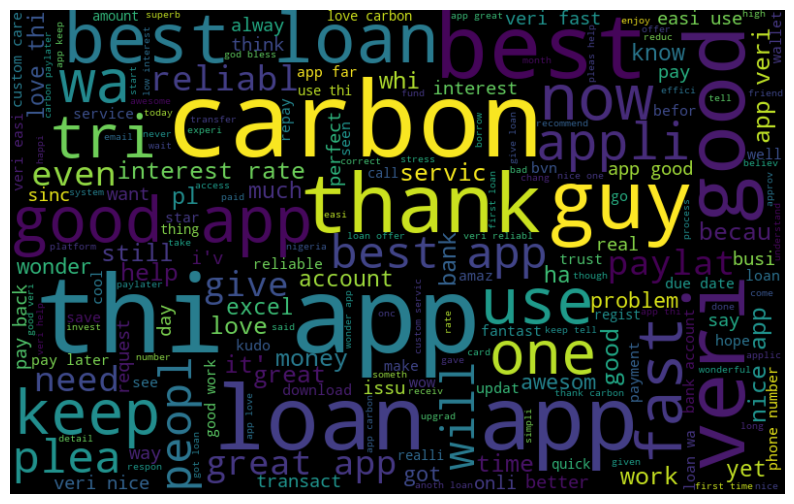

In [95]:
#Carbon Google Play
generate_wordcloud_2 (carbon_google1, ["title"])


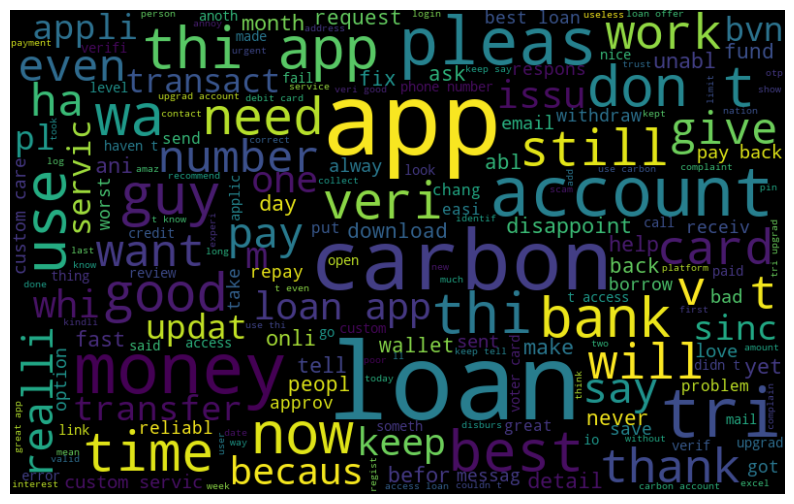

In [96]:
#Carbon appstore
generate_wordcloud_2 (carbon_app1, column_names = ["review", "title"])


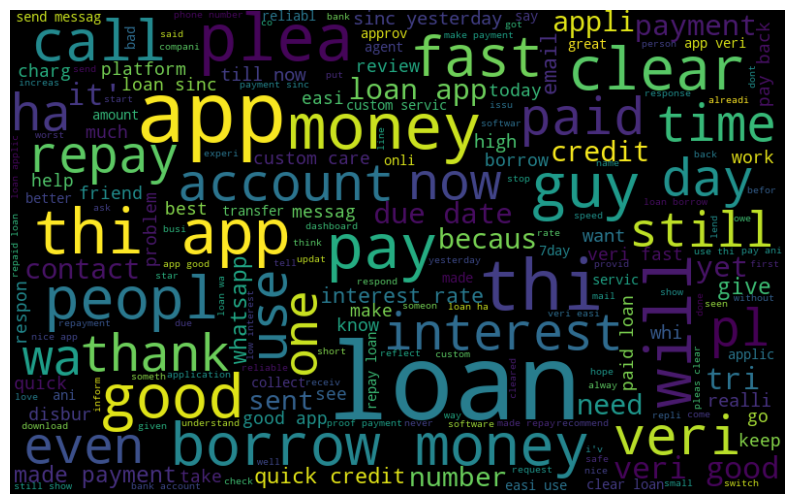

In [98]:
#quickcredit google
generate_wordcloud_2 (quickcredit_google1, column_names = ["title"])


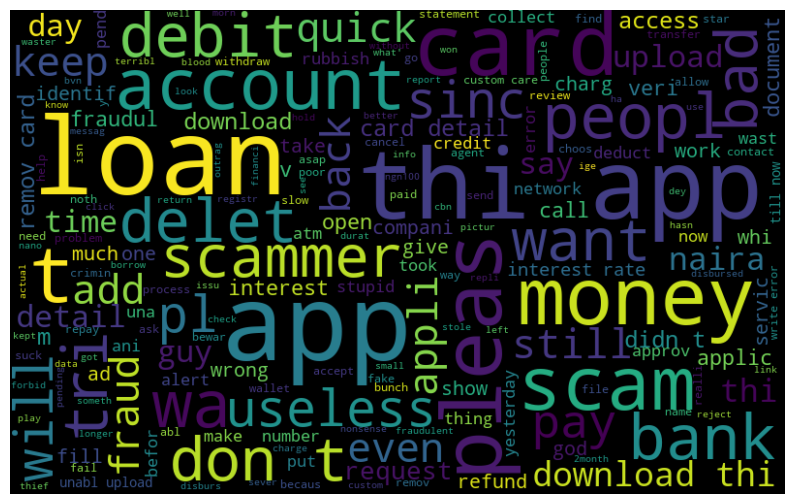

In [99]:
#quickcredit appstore
generate_wordcloud_2 (quickcredit_app1, column_names = ["review", "title"])


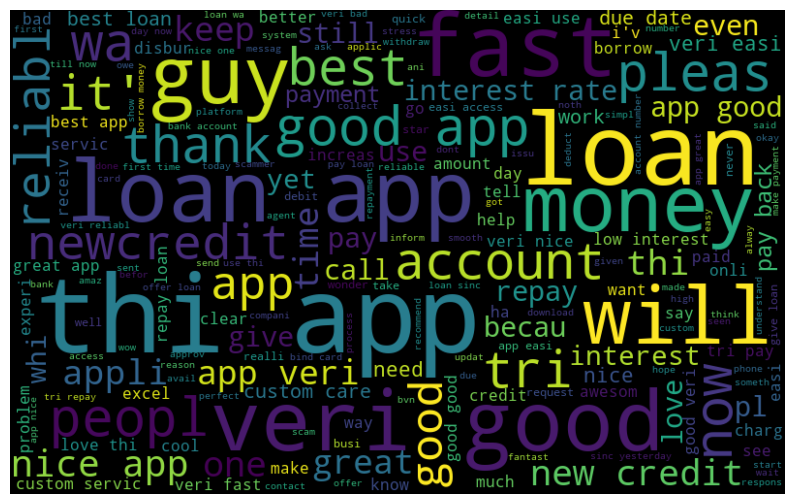

In [100]:
#newcredit google
generate_wordcloud_2 (newcredit_google1, column_names = ["title"])


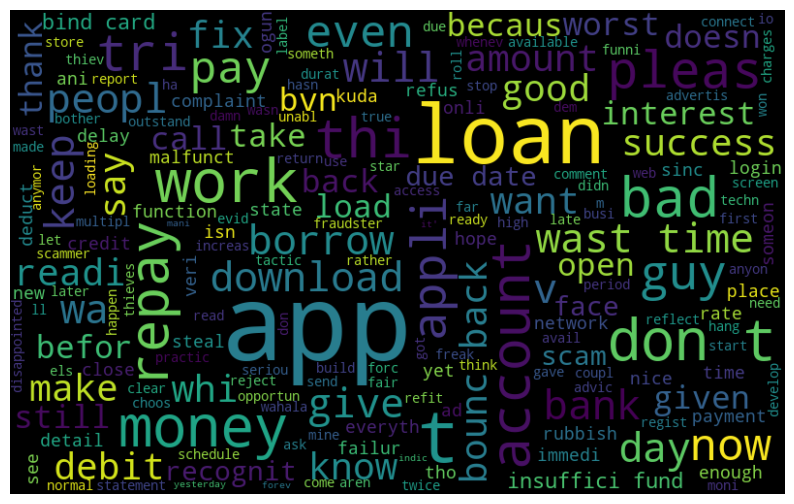

In [101]:
#newcredit appstore
generate_wordcloud_2 (newcredit_app1, column_names = ["review", "title"])


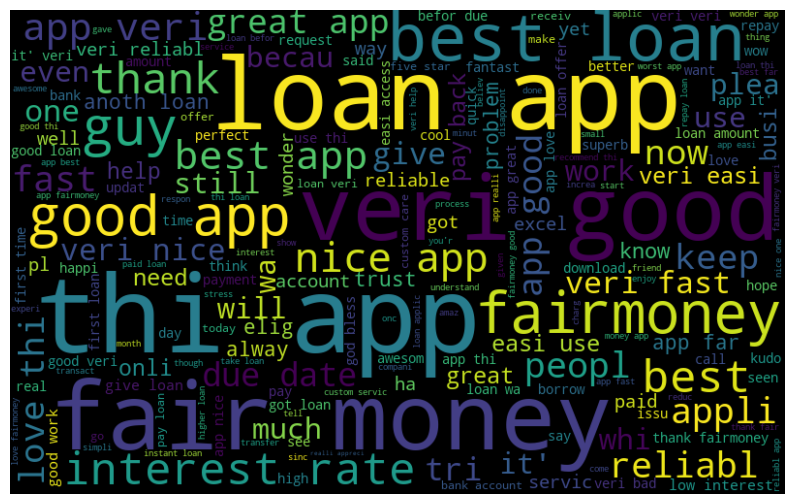

In [102]:
#fairmoney
generate_wordcloud_2 (fairmoney, column_names = ["title"])


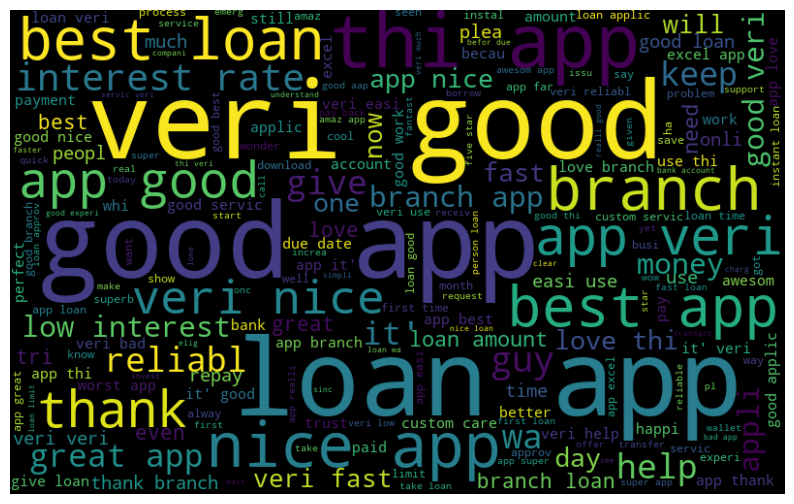

In [103]:
#branch
generate_wordcloud_2 (branch, column_names = ["title"])


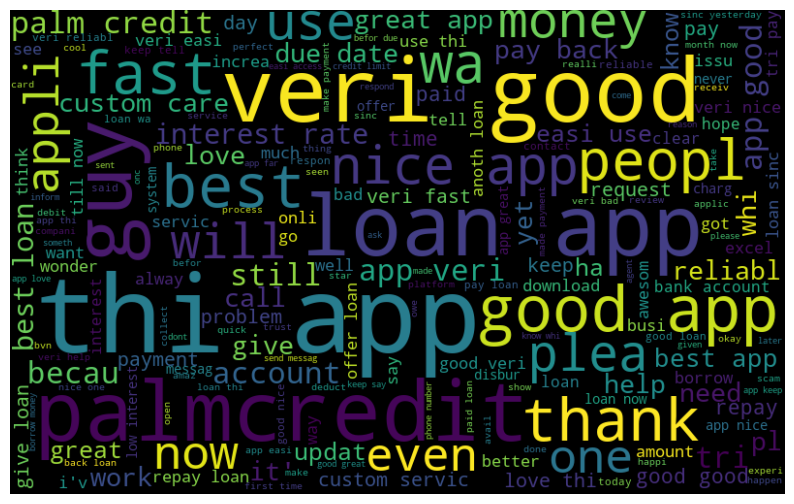

In [104]:
#palmcredit
generate_wordcloud_2 (palmcredit, column_names = ["title"])


> Good/Positive Reviews

In [106]:

def generate_wordcloud_good(df, column_names):
    """
    Generates a wordcloud from a pandas DataFrame for positive reviews. 
    i.e reviews with rating >= 3 (out of 5) 

    Parameters:
    df (pd.DataFrame): DataFrame containing the data
    column_names (list): List of column names in the DataFrame to generate the wordcloud from

    Returns:
    None
    """
    all_words = ' '.join([' '.join(text) for col in column_names for text in df[col][df["rating"] >= 3]])
    wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)

    plt.figure(figsize=(10, 7))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.show()

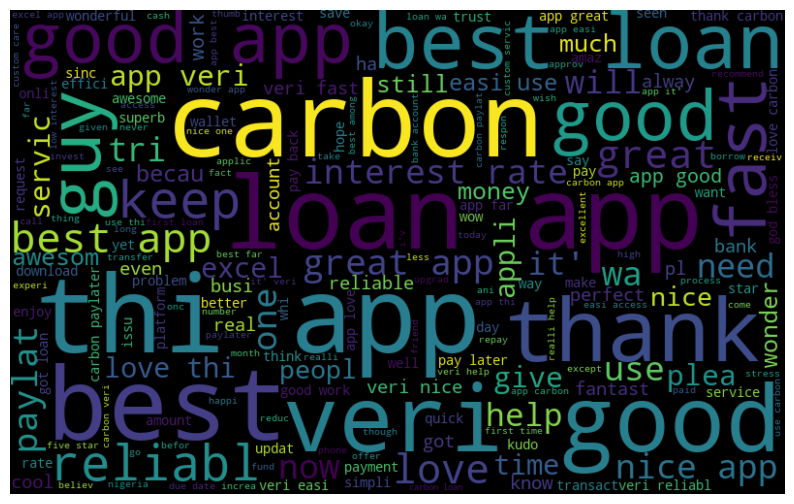

In [107]:
#Carbon Google Play
generate_wordcloud_good (carbon_google1, ["title"])


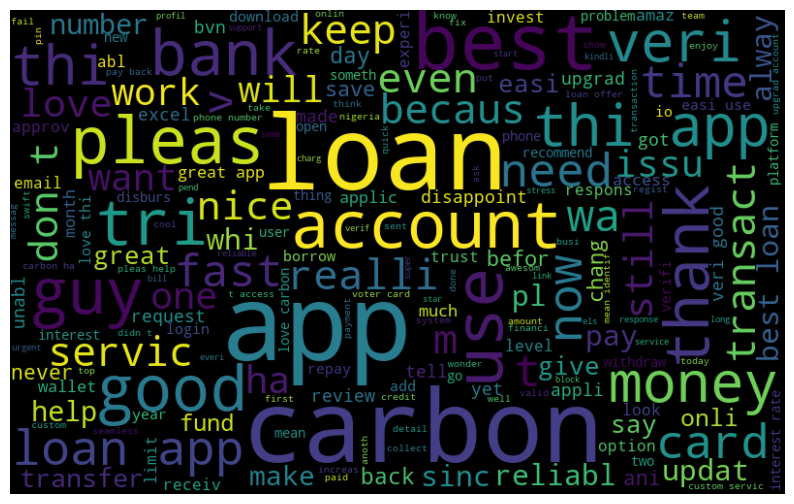

In [108]:
#Carbon appstore
generate_wordcloud_good (carbon_app1, column_names = ["review", "title"])


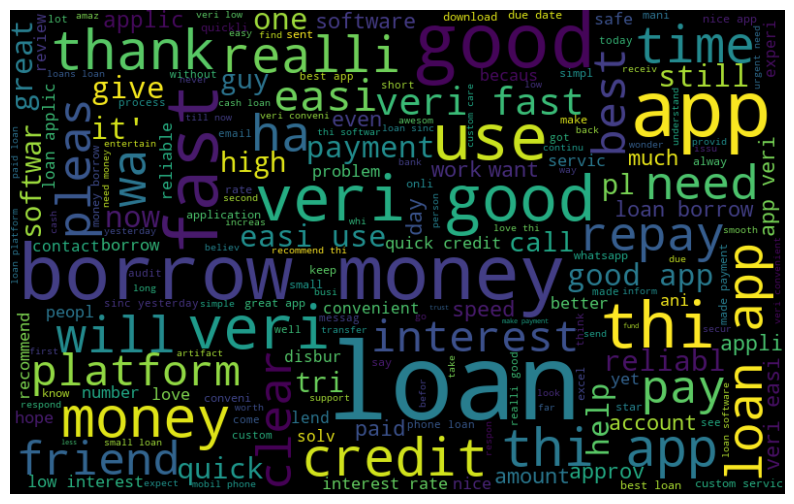

In [109]:
#quickcredit google
generate_wordcloud_good (quickcredit_google1, column_names = ["title"])


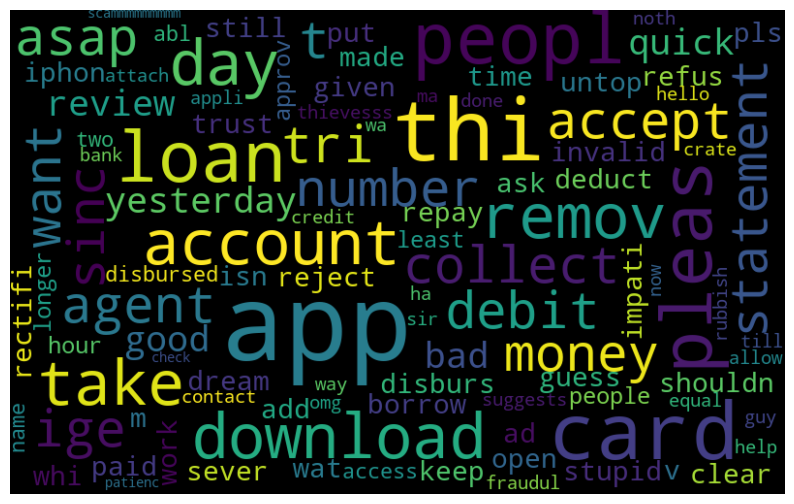

In [110]:
#quickcredit appstore
generate_wordcloud_good (quickcredit_app1, column_names = ["review", "title"])


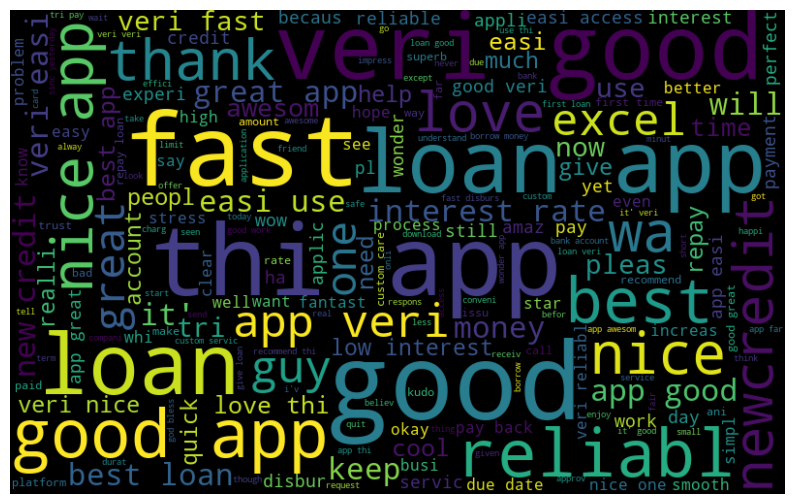

In [111]:
#newcredit google
generate_wordcloud_good (newcredit_google1, column_names = ["title"])


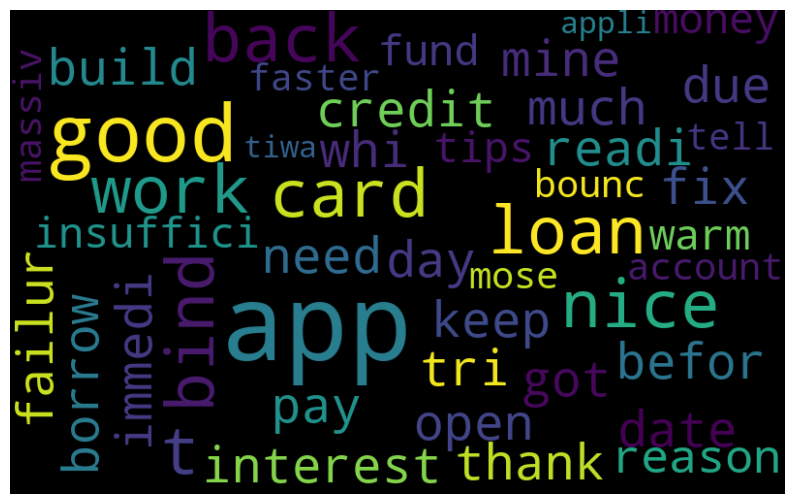

In [112]:
#newcredit appstore
generate_wordcloud_good (newcredit_app1, column_names = ["review", "title"])


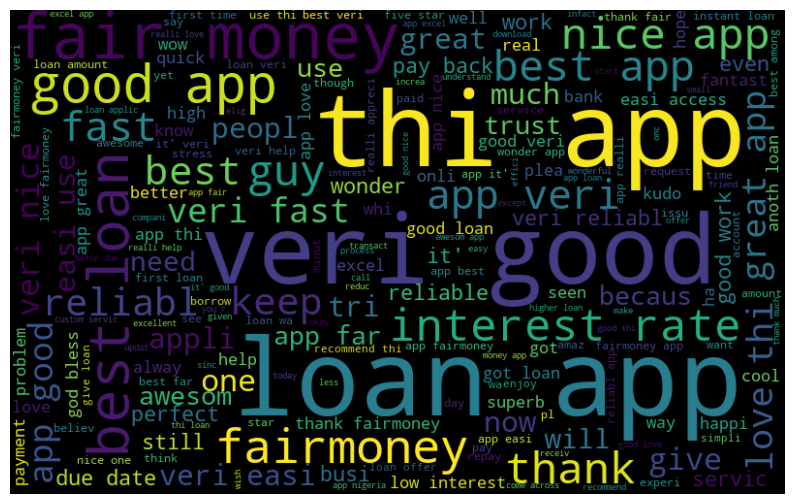

In [113]:
#fairmoney
generate_wordcloud_good (fairmoney, column_names = ["title"])


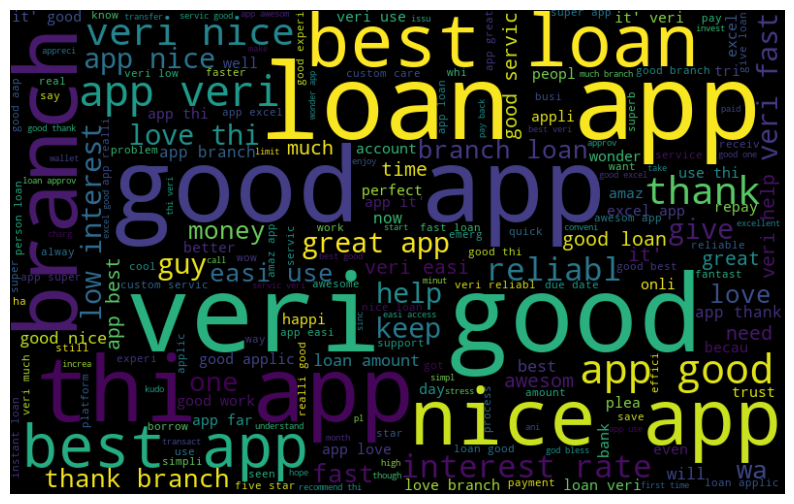

In [114]:
#branch
generate_wordcloud_good (branch, column_names = ["title"])


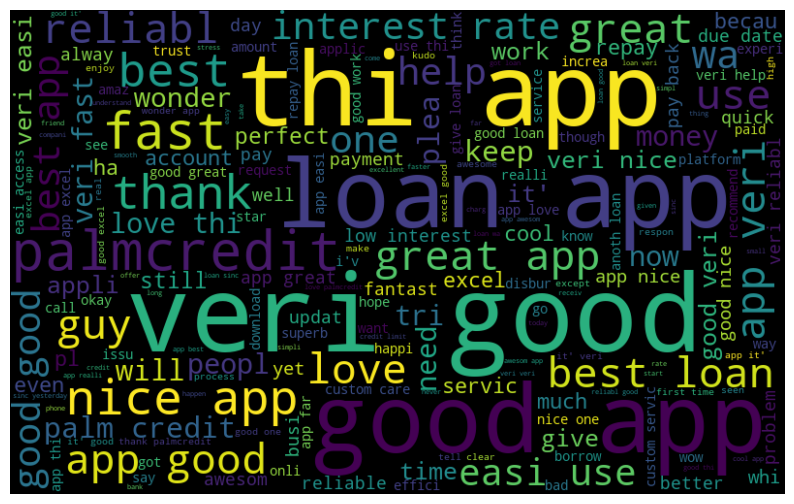

In [115]:
#palmcredit
generate_wordcloud_good (palmcredit, column_names = ["title"])


> Bad/Negative Reviews

In [116]:

def generate_wordcloud_bad(df, column_names):
    """
    Generates a wordcloud from a pandas DataFrame for positive reviews. 
    i.e reviews with rating < 3 (out of 5) 

    Parameters:
    df (pd.DataFrame): DataFrame containing the data
    column_names (list): List of column names in the DataFrame to generate the wordcloud from

    Returns:
    None
    """
    all_words = ' '.join([' '.join(text) for col in column_names for text in df[col][df["rating"] < 3]])
    wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)

    plt.figure(figsize=(10, 7))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.show()

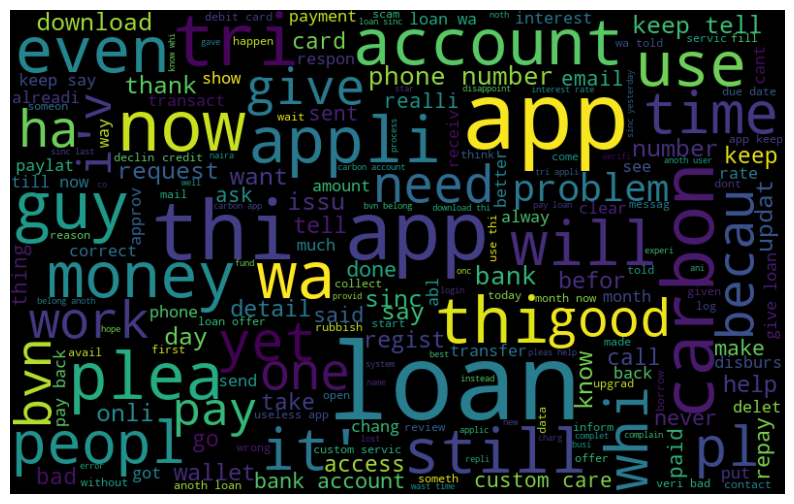

In [117]:
#Carbon Google Play
generate_wordcloud_bad (carbon_google1, ["title"])


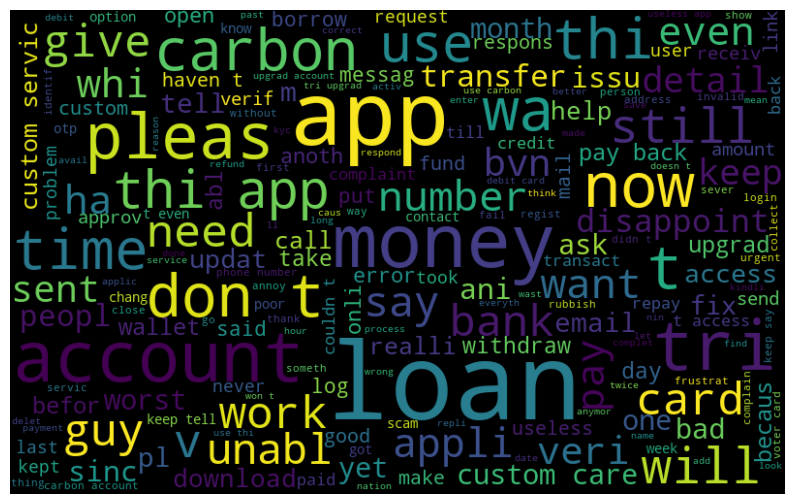

In [118]:
#Carbon appstore
generate_wordcloud_bad (carbon_app1, column_names = ["review", "title"])


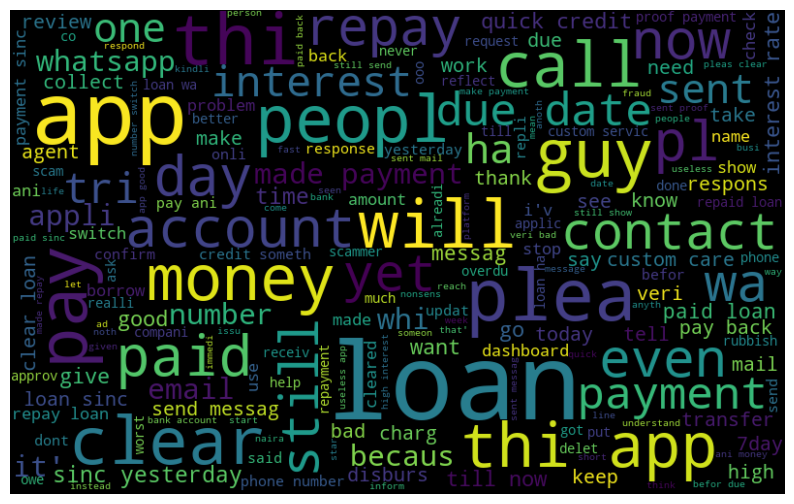

In [119]:
#quickcredit google
generate_wordcloud_bad (quickcredit_google1, column_names = ["title"])


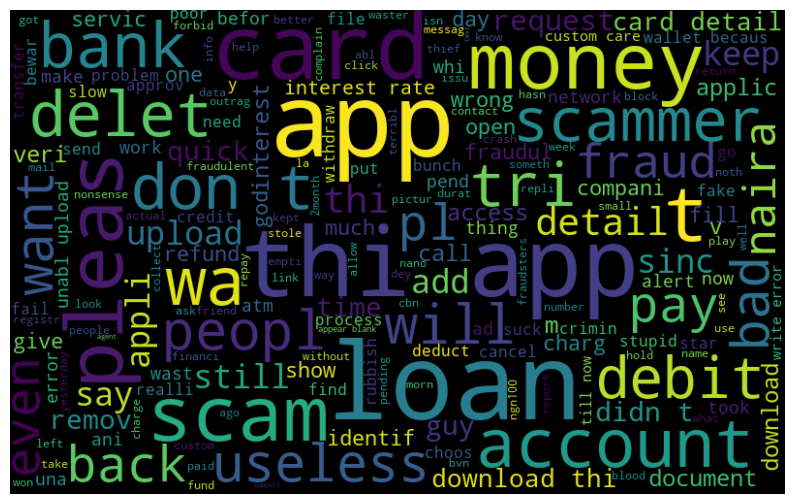

In [120]:
#quickcredit appstore
generate_wordcloud_bad (quickcredit_app1, column_names = ["review", "title"])


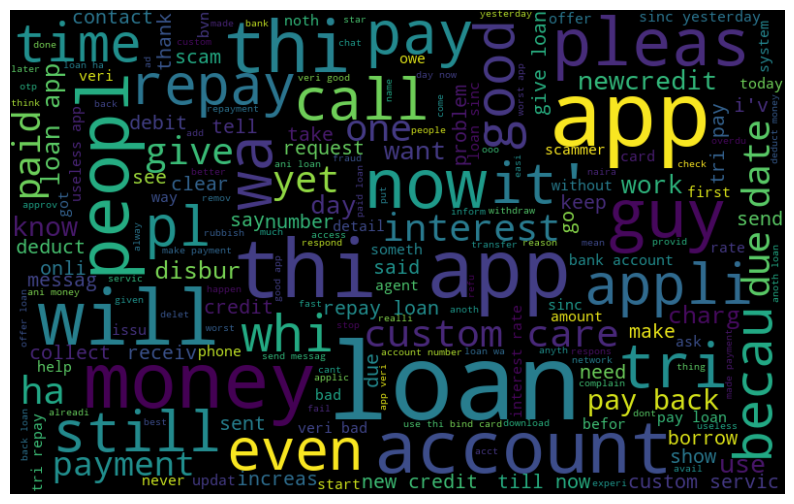

In [121]:
#newcredit google
generate_wordcloud_bad (newcredit_google1, column_names = ["title"])


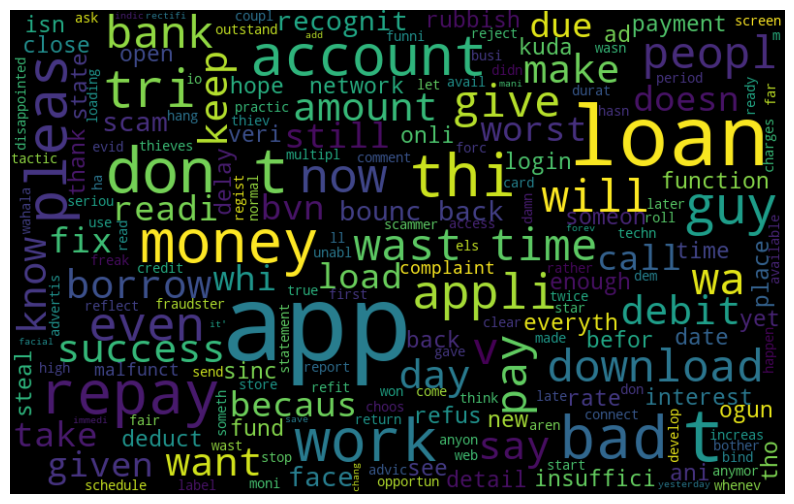

In [122]:
#newcredit appstore
generate_wordcloud_bad (newcredit_app1, column_names = ["review", "title"])


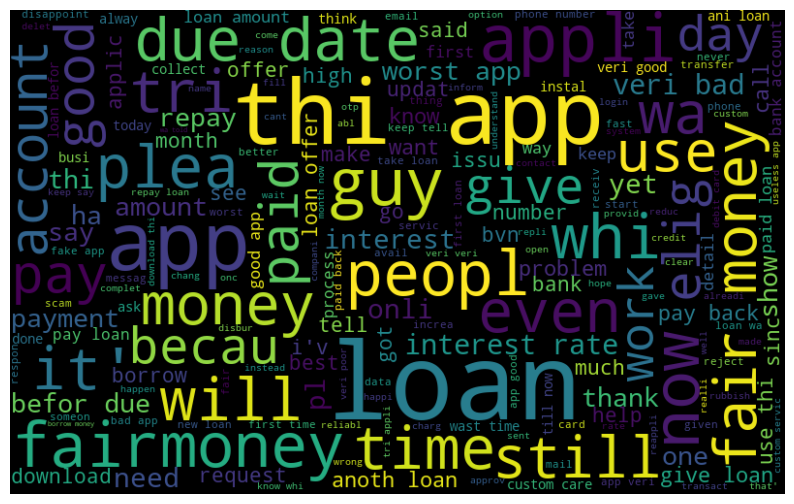

In [123]:
#fairmoney
generate_wordcloud_bad (fairmoney, column_names = ["title"])


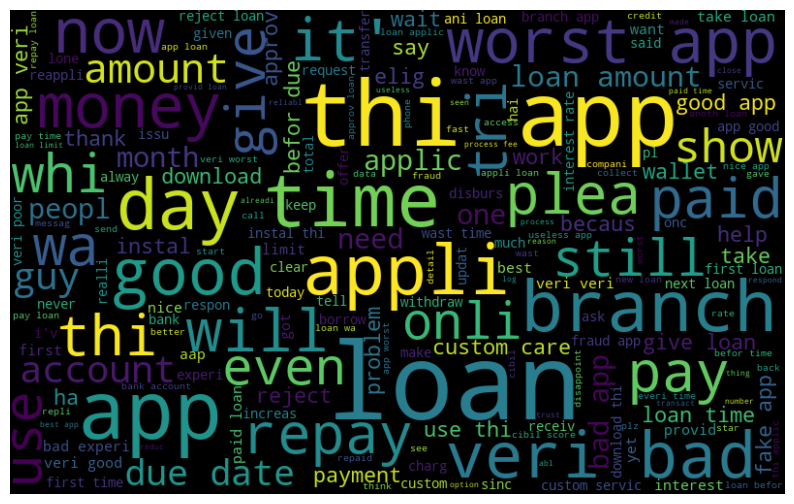

In [124]:
#branch
generate_wordcloud_bad (branch, column_names = ["title"])


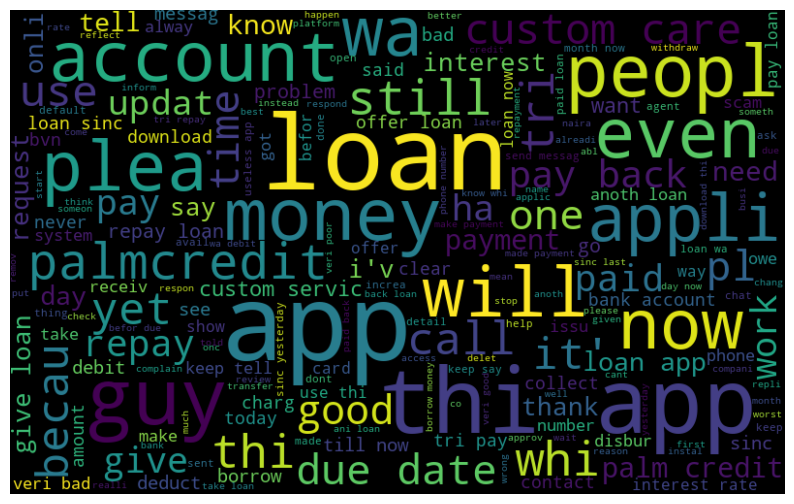

In [125]:
#palmcredit
generate_wordcloud_bad (palmcredit, column_names = ["title"])


###### Extracting Features from Cleaned Tweets

In [ ]:
#To analyze a preprocessed data, it needs to be converted into features. 
#Depending upon the usage, text features can be constructed using assorted techniques – Bag-of-Words, 
#TF-IDF, and Word Embeddings. In this article, we will be covering only Bag-of-Words and TF-IDF.


> Bag-of-Words Features

In [561]:
def bag_of_words_features(df, text_columns, target_columns):
    """
    This function takes in a DataFrame and one or two columns and returns a bag of words representation of the data as a DataFrame.

    Parameters:
    df (pandas DataFrame): The DataFrame to extract features from.
    column1 (str): The name of the first column to use as input data.
    column2 (str, optional): The name of the second column to use as input data. If not provided, only the first column will be used.

    Returns:
    pandas DataFrame: The bag of words representation of the input data as a DataFrame.
    """
        
    text_data = df[text_columns].apply(lambda x: " ".join([str(i) for i in x]), axis=1)

    text_data = text_data.str.lower()
    vectorizer = CountVectorizer(max_df=0.90, min_df=4, max_features=1000, stop_words=None)
    X_bow = vectorizer.fit_transform(text_data)
    # Use the new function to get the feature names
    feature_names = vectorizer.get_feature_names_out()
    df.dropna(subset=[target_column], inplace=True) if target_columns else None

    X_bow = pd.DataFrame(X_bow.toarray(), columns=feature_names)
    
    if target_columns:        
        y = df[target_columns]
        return X_bow, y
    
    return X_bow



In [562]:
carbon_google1.head(2)

,reviewId,userName,userImage,title,rating,thumbsUpCount,reviewCreatedVersion,date,developerResponse,developerResponseDate
0,c28addc6-eef3-4240-9624-473f501853e2,aneke collins,https://play-lh.googleusercontent.com/a-/ad5-w...,"[super, effective, and, seamless, services]",5,0,9.0.7,2023-01-24 05:41:18,"hi collins, it is delightful to hear such posi...",2023-01-24 08:16:23
1,985946fb-9939-4125-a074-11db461313c5,joshua odafe legbeti,https://play-lh.googleusercontent.com/a-/ad5-w...,"[the, best, banking, app, you, can, ever, come...",5,0,9.0.7,2023-01-24 05:14:06,"hi joshua, it is delightful to hear such posit...",2022-12-28 09:16:17


In [498]:
y.shape, X_bow.shape

((899,), (899, 715))

In [453]:
print(y.isnull().sum())

0


##### Model Building: Sentiment Analysis

###### Building model using Bag-of-Words features

In [563]:
def split_data(X, y, test_size=0.2, val_size=0.2, random_state=42):
    """
    This function splits the data into train and test sets, and further splits the train set into training and validation sets.
    
    df : pandas DataFrame
        The dataframe containing the input data.
    target_col : str
        The name of the target column in the dataframe.
    test_size : float, optional (default=0.2)
        The proportion of the data to be used for testing.
    val_size : float, optional (default=0.2)
        The proportion of the training data to be used for validation.
    random_state : int, optional (default=42)
        The seed used by the random number generator.
    
    Returns
    -------
    xtrain : pandas DataFrame
        The training input data.
    ytrain : pandas Series
        The training target data.
    xvalid : pandas DataFrame
        The validation input data.
    yvalid : pandas Series
        The validation target data.
    xtest : pandas DataFrame
        The test input data.
    ytest : pandas Series
        The test target data.
    """
    
#     X = df.drop(target_columns, axis=1)
#     X = df
#     y = df[target_columns]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)
    
    X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=val_size, random_state=random_state)
    
    return X_train, y_train, X_valid, y_valid, X_test, y_test




In [499]:
X_train.shape, X_valid.shape, X_test.shape, y_train.shape, y_valid.shape, y_test.shape

((575, 715), (575,), (144, 715), (144,), (180, 715), (180,))

In [497]:
X_valid.shape, y_valid.shape 

((575,), (180, 715))

In [547]:
# dataframes = [newcredit_app1]

# for i, df in enumerate(dataframes):
#     if "review" in df.columns:
#         text_columns = ["title", "review"]
#         for col in text_columns:
#             df[col] = df[col].apply(lambda x: " ".join(x))
#     else:
#         text_columns = ["title"]
# #         df[text_columns] = df[text_columns].apply(lambda x: " ".join(x))
    
#     target_columns = "rating"

#     params = []
#     X_bow, y = bag_of_words_features (df, text_columns, target_columns) 


# #     X_train, X_valid, X_test, y_train, y_valid, y_test = split_data(X_bow, y) 
#     X_train, y_train, X_valid, y_valid, X_test, y_test = split_data(X_bow, y) 
#     logistic_regression = LogisticRegression(random_state=42)
#     logistic_regression.fit(X_train, y_train)

#     # evaluate the model on the validation data
#     y_valid_pred = logistic_regression.predict(X_valid)
#     accuracy = accuracy_score(y_valid, y_valid_pred)
#     print("Accuracy: {:.2f}%".format(accuracy * 100))

#     # use the model to predict the sentiment of the test data
#     y_test_pred = logistic_regression.predict(X_test)
#     params.append(logistic_regression.coef_[0])

#     # Write the coefficients to a csv file
#     filename = "_coefficients.csv" + str(i) + ".csv"
#     pd.DataFrame(params).to_csv( filename, index=False)


Accuracy: 75.00%


In [565]:
dataframes = [carbon_google1, carbon_app1, 
              quickcredit_google1, quickcredit_app1,
             newcredit_google1, newcredit_app1,
             fairmoney, branch, palmcredit ]

params = []

for i, df in enumerate(dataframes):
    if "review" in df.columns:
        text_columns = ["title", "review"]
        for col in text_columns:
            df[col] = df[col].apply(lambda x: " ".join(x))
    else:
        text_columns = ["title"]
#         df[text_columns] = df[text_columns].apply(lambda x: " ".join(x))
    
    target_columns = "rating"


    X_bow, y = bag_of_words_features (df, text_columns, target_columns)
    X_train, y_train, X_valid, y_valid, X_test, y_test = split_data(X_bow, y) 
    logistic_regression = LogisticRegression(random_state=42)
    logistic_regression.fit(X_train, y_train)
    
    # evaluate the model on the validation data
    y_valid_pred = logistic_regression.predict(X_valid)
    accuracy = accuracy_score(y_valid, y_valid_pred)
    print("Accuracy: {:.2f}%".format(accuracy * 100))
    
    # use the model to predict the sentiment of the test data
    y_test_pred = logistic_regression.predict(X_test)
    params.append(logistic_regression.coef_[0])
    
    # Write the coefficients to a csv file
    filename = "models/coefficients"  + str(i) + ".csv"
    pd.DataFrame(params).to_csv( filename, index=False)



C:\Users\Cornel\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 76.36%
Accuracy: 59.72%


C:\Users\Cornel\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 69.55%
Accuracy: 82.35%


C:\Users\Cornel\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 73.48%
Accuracy: 75.00%


C:\Users\Cornel\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 76.39%


C:\Users\Cornel\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 80.81%


C:\Users\Cornel\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 77.06%


In [568]:
carbon_google1["title"].head(4)

0          [super, effective, and, seamless, services]
1    [the, best, banking, app, you, can, ever, come...
2                          [fully, automated,, secure]
3                              [love, carbon, banking]
Name: title, dtype: object

In [567]:
carbon_app1["title"].head(5)

618               recommendation
221            favorite loan app
306                   unable get
845    loan amount given limited
634                          tee
Name: title, dtype: object

We trained the logistic regression model on the Bag-of-Words features and it gave us an F1-score of 0.53 for the validation set. Now we will use this model to predict for the test data